<a href="https://colab.research.google.com/github/Ratnasari124/PCVK_RATNASARI_2024/blob/main/2241720007_Ratnasari_PCVK_Jobsheet_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**PCVK JOBSHEET 5**

Nama : Ratnasari

NIM : 2241720007

Kelas : TI 3D

link jobsheet : https://drive.google.com/file/d/18Lq1GNsyanfNqNVWCXaXdiNLVgjEB0lM/view

link github : https://github.com/Ratnasari124/PCVK_RATNASARI_2024/blob/main/2241720007_Ratnasari_PCVK_Jobsheet_5.ipynb

link drive gambar noise : https://drive.google.com/drive/folders/15aMXk3e5T4ut7Yb5WW28QSI_t6S5Ch3J


# SOAL NO 1

**1. Buat Gamma Correction sesuai dengan petunjuk berikut**

Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai
Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk
meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image
dengan gamma correction sesuai rumus yang telah diberikan.

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


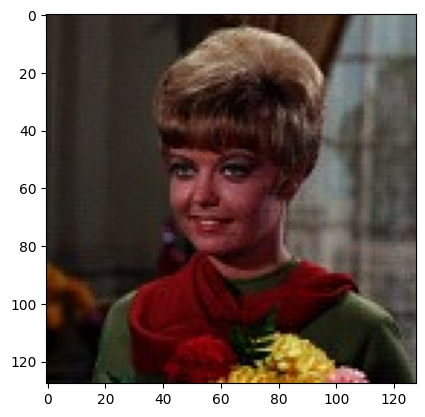

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
img = cv.imread('/content/drive/MyDrive/ratna/female.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.imshow(img)

Gamma Correction Pada Citra
Masukkan Nilai Gamma : 3


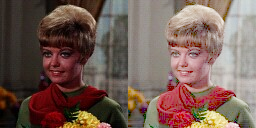

In [ ]:
print('Gamma Correction Pada Citra')
print('===========================')
try :
  gamma = int(input('Masukkan Nilai Gamma : '))
except ValueError:
  print('Error, not a number');

original = cv.imread('/content/drive/MyDrive/ratna/female.jpg')
gamma_image = np.zeros(original.shape, original.dtype)

#Melakukan Akses Per Piksel dengan 3 Looping

for x in range(original.shape[0]): #looping baris
  for y in range(original.shape[1]): #looping kolom
    for z in range(original.shape[2]): #looping channel
     gamma_image[x,y,z] = np.clip(255 * pow(original[x,y,z]/255,(1/gamma)), 0, 255) #pow = pangkat

final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

**Penjelasan** : Kode ini digunakan untuk koreksi gamma yang mengubah tampilan gambar dengan mengatur kecerahan dan kontrasnya. user diminta untuk memasukkana nilai gamma. Kemudian melakukan perhitungan pada setiap pikselnya, lalu menampilkan perbandingan antara gambar asli dan yang sudah diperbaiki. Maka tampilan akhirnya akan berubah. Jadi, kode ini membantu memperbaiki tampilan gambar, membuatnya lebih cerah atau lebih kontras, tergantung pada nilai gamma yang dimasukkan tadi.

# SOAL NO 2

---



**2. Buat Simulasi Image Depth**

Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra,
pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada
pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga
255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000
0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika
7bit, maka jumlah warnanya adalah 27
= 128, dst.
Berikut adalah kode untuk membaca citra masukan dan memberi nilai kedalaman citra,
silahkan lanjutkan kode program berikut sehingga menghasilkan keluaran seperti contoh
pada Gambar.

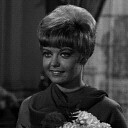

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

img = cv.imread('/content/drive/MyDrive/ratna/female.jpg', cv.IMREAD_GRAYSCALE)
original = cv.cvtColor(img, cv.COLOR_BGR2RGB) # konversi channel BGR -> RGB
cv2_imshow(original)


 Bit Depth Pada Citra 


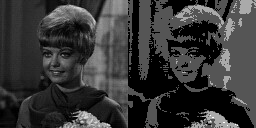

In [ ]:
print(' Bit Depth Pada Citra ')
print('======================')

bit_depth=2
level = 255 / (pow(2,bit_depth)-1)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
     gamma_image[y,x,c] = np.clip(round(original[y,x,c] / level) * level, 0, 255);
depth_image = np.zeros(original.shape, original.dtype)
final_frame = cv.hconcat((original, gamma_image))
cv2_imshow(final_frame)

**Penjelasan:** Pada kode diatas hasil akhirnya adalah perbandingan antara citra asli dan citra dengan Bit Depth yang telah diubah menjadi 2 bit. Dengan mengubah Bit Depth dapat mempengaruhi sejauh mana citra dapat menggambarkan warna dan detailnya.

# SOAL NO 3

---



**3. Buat modul Average Denoising**

Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab sebelumnya. Citra asli sudah disediakan pada /images/galaxy.jpg. 100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder , gunakan modul glob (import glob).

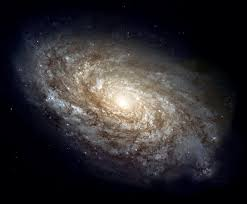

In [25]:
import glob
import cv2 as cv

original_galaxy = cv.imread('/content/drive/MyDrive/ratna/galaxy.jpeg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/ratna/noises/*'):
  n= cv.imread(img)
cv_img.append(n)
cv2_imshow(n)

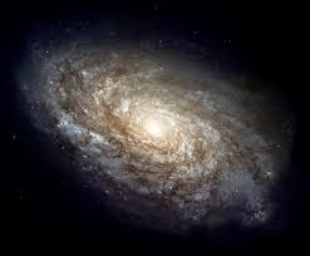

In [26]:
from google.colab.patches import cv2_imshow

# Load the image
original_galaxy = cv.imread('/content/drive/MyDrive/ratna/galaxy.jpeg')

# Resize the image to 256x310
resized_galaxy = cv.resize(original_galaxy, (310, 256))

cv2_imshow(resized_galaxy)

Jumlah Citra di Average : 5
--------------------------------------------------------
Nilai PSNR: 27.66 dB


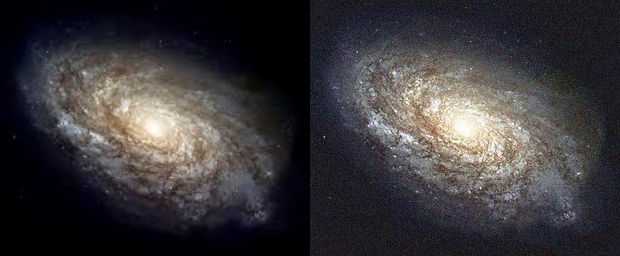

In [27]:
import cv2 as cv
import numpy as np
import glob
from google.colab.patches import cv2_imshow
from math import log10, sqrt

# Rumus PSNR
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:  # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Load noise images (5)
noise_images = [cv.imread(img) for img in glob.glob('/content/drive/MyDrive/ratna/noises/*.jpg')][:5]

# Average denoising
denoised_img = np.mean(noise_images, axis=0).astype(np.uint8)

# Menghitung PSNR
psnr_value = PSNR(resized_galaxy, denoised_img)

print("Jumlah Citra di Average : 5")
print("--------------------------------------------------------")
# Menampilkan hasiL
print(f"Nilai PSNR: {psnr_value:.2f} dB")
final_frame = cv.hconcat((resized_galaxy, denoised_img))   # Menggabungkan gambar asli dengan yang sudah dimodifikasi
cv2_imshow(final_frame)                                    # Menampilkan gambar

Jumlah Citra di Average : 10
--------------------------------------------------------
Nilai PSNR: 27.68 dB


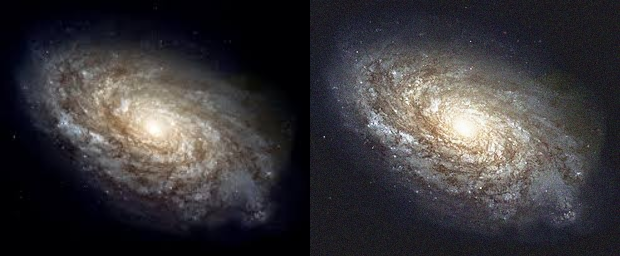

In [28]:
# Rumus PSNR
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:  # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Load noise images (10)
noise_images = [cv.imread(img) for img in glob.glob('/content/drive/MyDrive/ratna/noises/*.jpg')][:10]

# Average denoising
denoised_img = np.mean(noise_images, axis=0).astype(np.uint8)

# Menghitung PSNR
psnr_value = PSNR(resized_galaxy, denoised_img)

print("Jumlah Citra di Average : 10")
print("--------------------------------------------------------")
# Menampilkan hasiL
print(f"Nilai PSNR: {psnr_value:.2f} dB")
final_frame = cv.hconcat((resized_galaxy, denoised_img))   # Menggabungkan gambar asli dengan yang sudah dimodifikasi
cv2_imshow(final_frame)                                    # Menampilkan gambar

Jumlah Citra di Average : 20
--------------------------------------------------------
Nilai PSNR: 27.74 dB


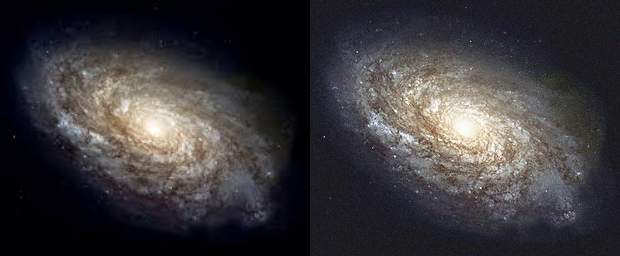

In [29]:
# Rumus PSNR
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:  # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Load noise images (20)
noise_images = [cv.imread(img) for img in glob.glob('/content/drive/MyDrive/ratna/noises/*.jpg')][:20]

# Average denoising
denoised_img = np.mean(noise_images, axis=0).astype(np.uint8)

# Menghitung PSNR
psnr_value = PSNR(resized_galaxy, denoised_img)

print("Jumlah Citra di Average : 20")
print("--------------------------------------------------------")
# Menampilkan hasiL
print(f"Nilai PSNR: {psnr_value:.2f} dB")
final_frame = cv.hconcat((resized_galaxy, denoised_img))   # Menggabungkan gambar asli dengan yang sudah dimodifikasi
cv2_imshow(final_frame)                                    # Menampilkan gambar

Jumlah Citra di Average : 40
--------------------------------------------------------
Nilai PSNR: 27.75 dB


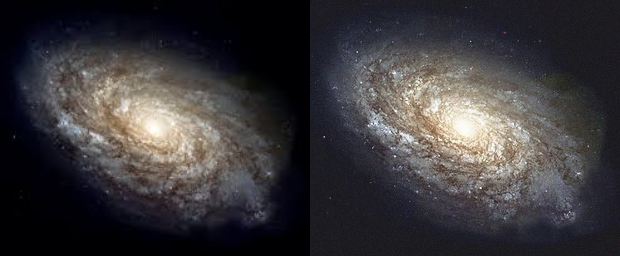

In [30]:
# Rumus PSNR
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:  # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Load noise images (40)
noise_images = [cv.imread(img) for img in glob.glob('/content/drive/MyDrive/ratna/noises/*.jpg')][:40]

# Average denoising
denoised_img = np.mean(noise_images, axis=0).astype(np.uint8)

# Menghitung PSNR
psnr_value = PSNR(resized_galaxy, denoised_img)

print("Jumlah Citra di Average : 40")
print("--------------------------------------------------------")
# Menampilkan hasiL
print(f"Nilai PSNR: {psnr_value:.2f} dB")
final_frame = cv.hconcat((resized_galaxy, denoised_img))   # Menggabungkan gambar asli dengan yang sudah dimodifikasi
cv2_imshow(final_frame)                                    # Menampilkan gambar

Jumlah Citra di Average : 80
--------------------------------------------------------
Nilai PSNR: 27.73 dB


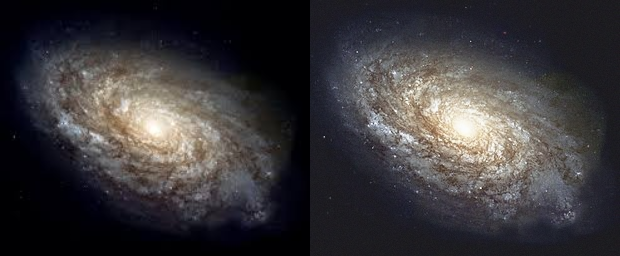

In [31]:
# Rumus PSNR
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:  # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Load noise images (80)
noise_images = [cv.imread(img) for img in glob.glob('/content/drive/MyDrive/ratna/noises/*.jpg')][:80]

# Average denoising
denoised_img = np.mean(noise_images, axis=0).astype(np.uint8)

# Menghitung PSNR
psnr_value = PSNR(resized_galaxy, denoised_img)

print("Jumlah Citra di Average : 80")
print("--------------------------------------------------------")
# Menampilkan hasiL
print(f"Nilai PSNR: {psnr_value:.2f} dB")
final_frame = cv.hconcat((resized_galaxy, denoised_img))   # Menggabungkan gambar asli dengan yang sudah dimodifikasi
cv2_imshow(final_frame)                                    # Menampilkan gambar

Jumlah Citra di Average : 100
--------------------------------------------------------
Nilai PSNR: 27.75 dB


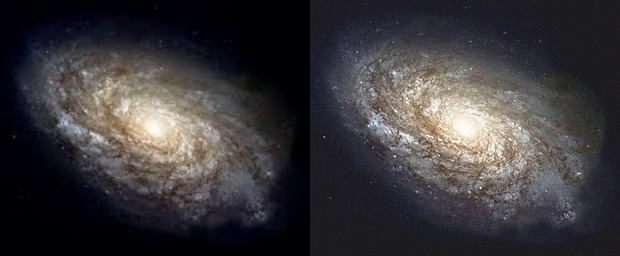

In [32]:
# Rumus PSNR
def PSNR(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:  # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Load noise images (100)
noise_images = [cv.imread(img) for img in glob.glob('/content/drive/MyDrive/ratna/noises/*.jpg')][:100]

# Average denoising
denoised_img = np.mean(noise_images, axis=0).astype(np.uint8)

# Menghitung PSNR
psnr_value = PSNR(resized_galaxy, denoised_img)

print("Jumlah Citra di Average : 100")
print("--------------------------------------------------------")
# Menampilkan hasiL
print(f"Nilai PSNR: {psnr_value:.2f} dB")
final_frame = cv.hconcat((resized_galaxy, denoised_img))   # Menggabungkan gambar asli dengan yang sudah dimodifikasi
cv2_imshow(final_frame)                                    # Menampilkan gambar

**Dari hasil PSNR yang anda catat pada tabel diatas, kesimpulan yang dapat diambil adalah**

Dari percobaan yang saya lakukan dapat disimpulkan, semakin banyak jumlah citra / image yang digunakan maka nilai PNSR akan semakin tinggi atau hasil dari citra denoise semakin mendekati citra asli (karena noise semakin berkurang).

# SOAL NO 4

---



4. Buat image masking untuk image berikut. Image kiri adalah image asli (image KTP),
sedangkan image paling kanan adalah hasilnya:

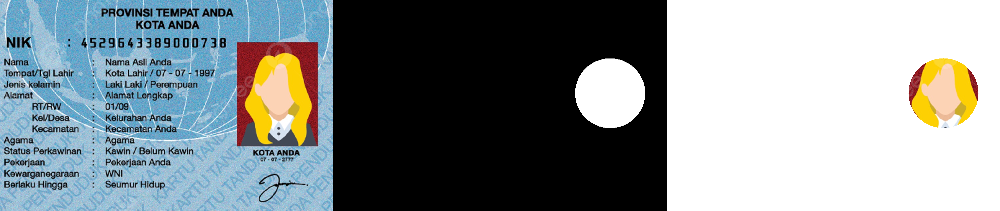

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img = cv.imread('/content/drive/MyDrive/ratna/gambar ktp.jpg')
mask = np.zeros(img.shape, dtype=np.uint8)
mask = cv.circle(mask, (-70, 40), 50, (255,255,255), -1)

mask2 = np.zeros(img.shape, dtype=np.uint8)
mask2 = cv.circle(mask, (830, 280), 105, (255,255,255), -1)

result = img & mask & mask2
result[mask==0] = 255

final_frame = cv.hconcat((img, mask, result))
cv2_imshow(final_frame)

# SOAL NO 5

---


5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini.
Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu.

## NOT (komplemen)

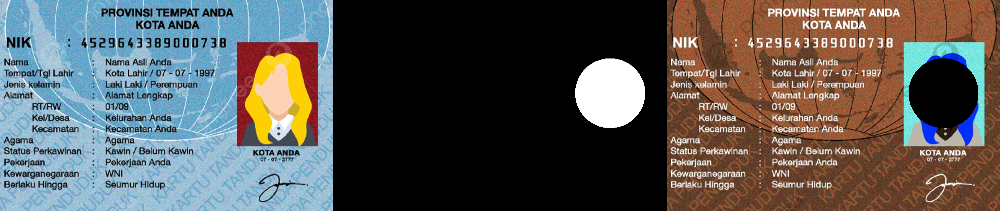

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_not = cv.imread('/content/drive/MyDrive/ratna/gambar ktp.jpg')
mask = np.zeros(img.shape, dtype=np.uint8)

mask = cv.circle(mask, (830, 280), 105, (255,255,255), -1)

masked = ~img_not & ~mask

frame_pink = cv.hconcat((img_not, mask, masked))
cv2_imshow(frame_pink)

## OR (atau)

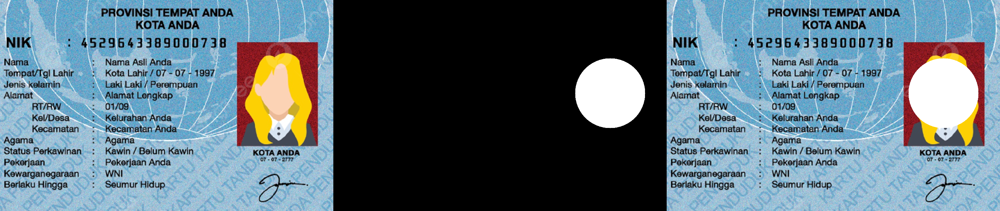

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_or = cv.imread('/content/drive/MyDrive/ratna/gambar ktp.jpg')
mask = np.zeros(img_or.shape, dtype=np.uint8)
mask = cv.circle(mask, (830, 280), 105, (255,255,255), -1)

masked = img_or | mask

frame_pink = cv.hconcat((img_or, mask, masked))
cv2_imshow(frame_pink)

## AND (dan)

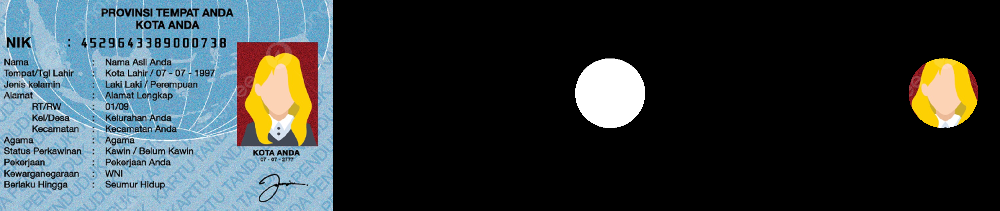

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_and = cv.imread('/content/drive/MyDrive/ratna/gambar ktp.jpg')
mask = np.zeros(img_and.shape, dtype=np.uint8)
mask = cv.circle(mask, (830, 280), 105, (255,255,255), -1)

masked = img_and & mask

frame_pink = cv.hconcat((img_and, mask, masked))
cv2_imshow(frame_pink)

## NAND (Not And)

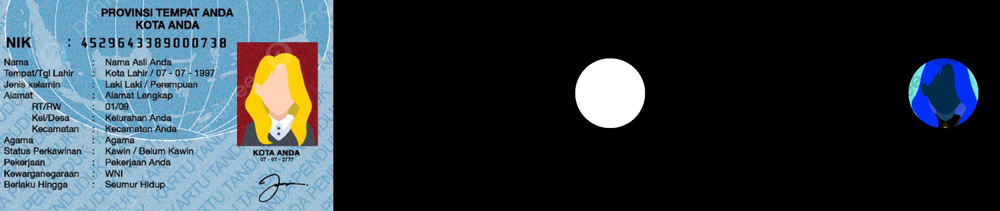

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_nand = cv.imread('/content/drive/MyDrive/ratna/gambar ktp.jpg')
mask = np.zeros(img_nand.shape, dtype=np.uint8)
mask = cv.circle(mask, (830, 280), 105, (255,255,255), -1)

masked = ~img_nand & mask

frame_pink = cv.hconcat((img_nand, mask, masked))
cv2_imshow(frame_pink)

## XOR (Exclusive Or)

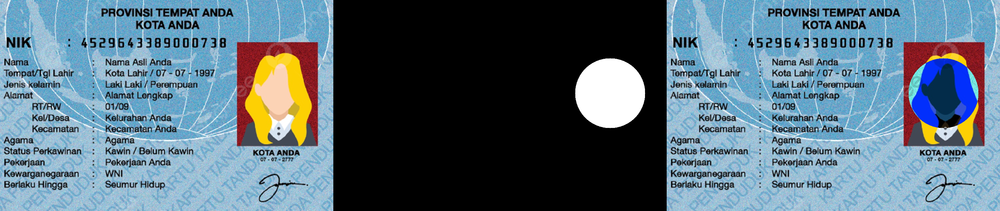

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

img_xor = cv.imread('/content/drive/MyDrive/ratna/gambar ktp.jpg')
mask = np.zeros(img_xor.shape, dtype=np.uint8)
mask = cv.circle(mask, (830, 280), 105, (255,255,255), -1)

masked = img_xor ^ mask

frame_pink = cv.hconcat((img_xor, mask, masked))
cv2_imshow(frame_pink)